# Load libraries

In [61]:
# Importing packages
import requests
import zipfile
import io
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import random
from neuralprophet import NeuralProphet, set_random_seed
import kaleido 
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from xgboost import XGBRegressor
from inmet_data_functions import read_inmet_station_data

# Seeting seeds
seed = 1
random.seed(seed)
np.random.seed(seed)
set_random_seed(seed)

# Disable logging messages unless it is an error
#set_log_level("ERROR")

# Read data from station 'A652'

In [16]:
# Gathering data for a specific station from a defined time span
station_data = read_inmet_station_data(station = 'A652', years = range(2020, 2025))

DATA\INMET_DATA_2020.csv
(8784, 27)
DATA\INMET_DATA_2021.csv
(8760, 27)
DATA\INMET_DATA_2022.csv
(8760, 27)
DATA\INMET_DATA_2023.csv
(8760, 27)
DATA\INMET_DATA_2024.csv
(3648, 27)


In [5]:
# Showing data infos
station_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38712 entries, 0 to 38711
Data columns (total 27 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   DATA                                 38712 non-null  object 
 1   HORA                                 38712 non-null  int64  
 2   PRECIPITACAO_TOTAL                   35711 non-null  float64
 3   PRESSAO_ATM                          38171 non-null  float64
 4   PRESSAO_ATM_MAX_HORA_ANT             38157 non-null  float64
 5   PRESSAO_ATM_MIN_HORA_ANT             38157 non-null  float64
 6   RADIACAO_GLOBAL                      21452 non-null  float64
 7   TEMPERATURA_AR                       36459 non-null  float64
 8   TEMPERATURA_AR_ORVALHO               33114 non-null  float64
 9   TEMPERATURA_AR_MAX_HORA_ANT          36450 non-null  float64
 10  TEMPERATURA_AR_MIN_HORA_ANT          36450 non-null  float64
 11  TEMPERATURA_AR_ORVALHO_MAX_H

# Create a datetime variable

In [19]:
# Remove ':' and format time correctly
station_data['HORA'] = station_data['HORA'].astype(str)
station_data['HORA'] = station_data['HORA'].str.pad(width=4, side='left', fillchar='0')  # Ensure time is always 4 digits

# Replacing '/' for '-' and format date correctly
station_data['DATA'] = station_data['DATA'].str.replace('/', '-')

# Combine date and time into a new datetime column
station_data['DATA_HORA'] = pd.to_datetime(station_data['DATA'] + ' ' + station_data['HORA'], format='%Y-%m-%d %H%M')

# Descriptive analysis

In [ ]:
# Summury oh the dataset
station_data.describe()

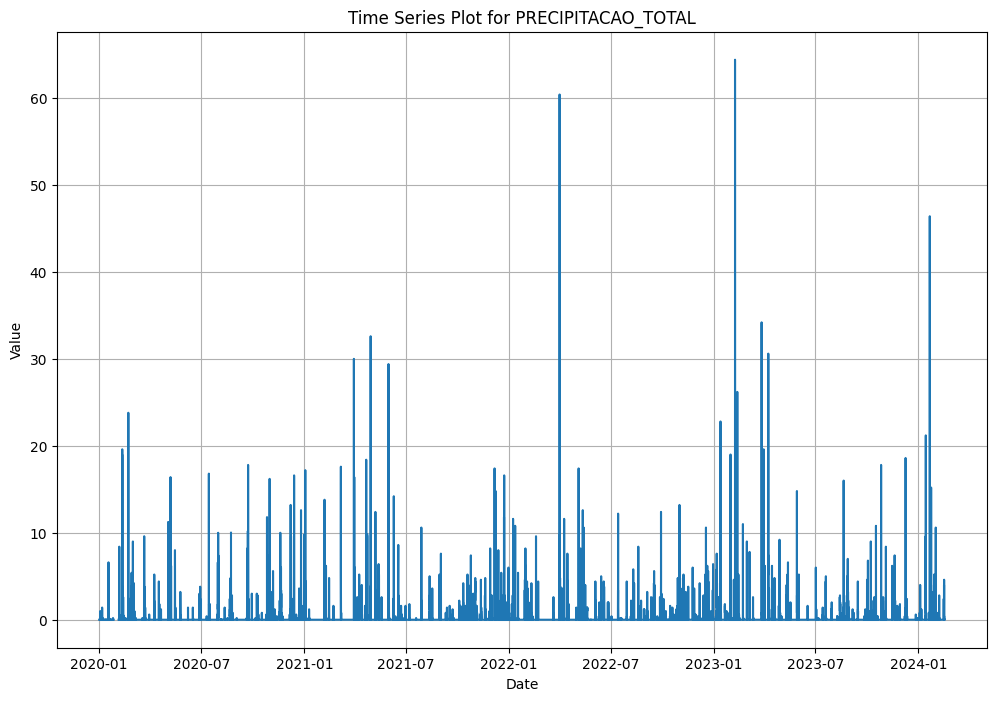

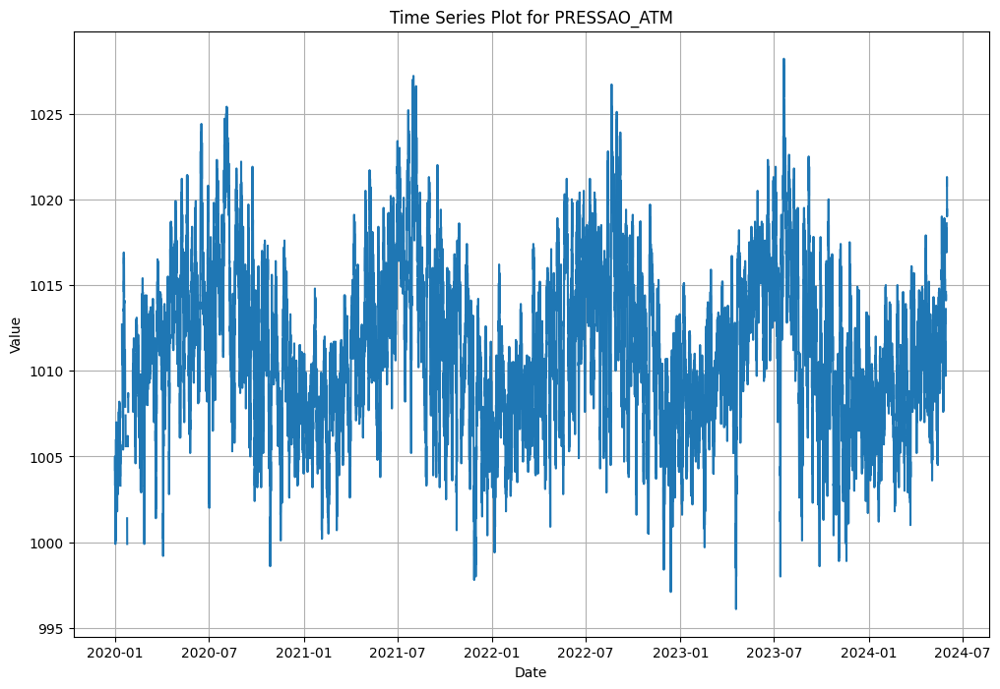

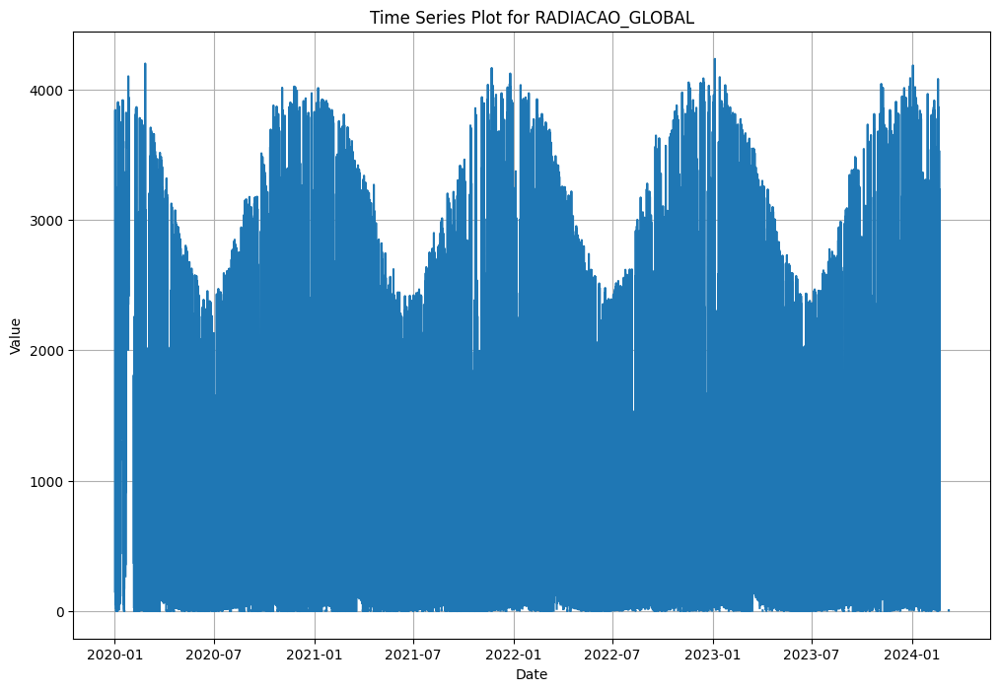

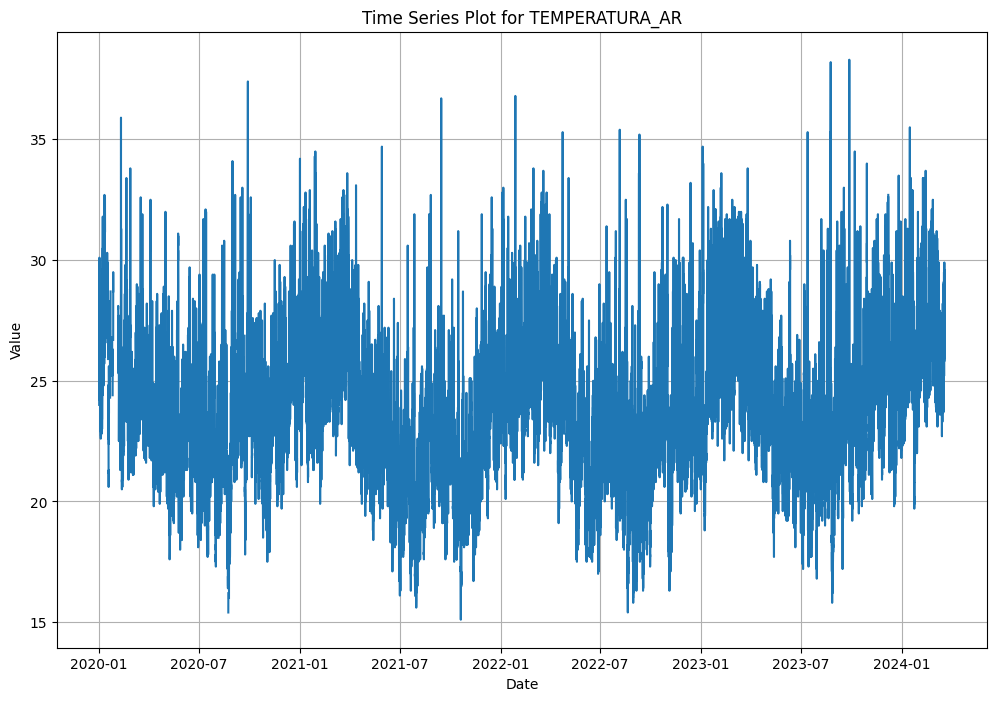

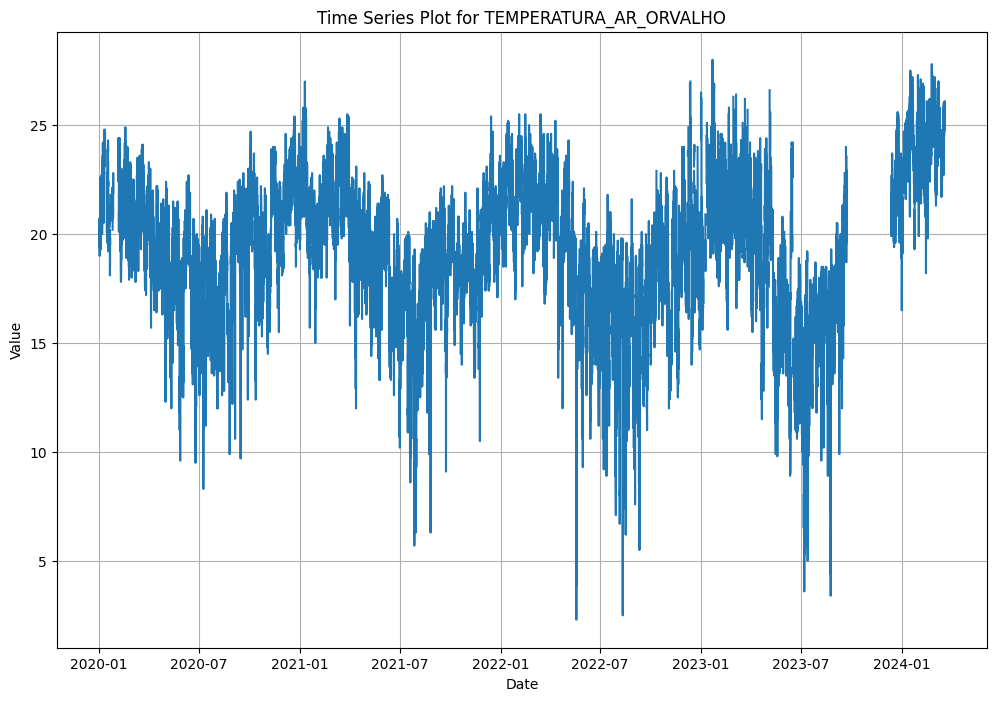

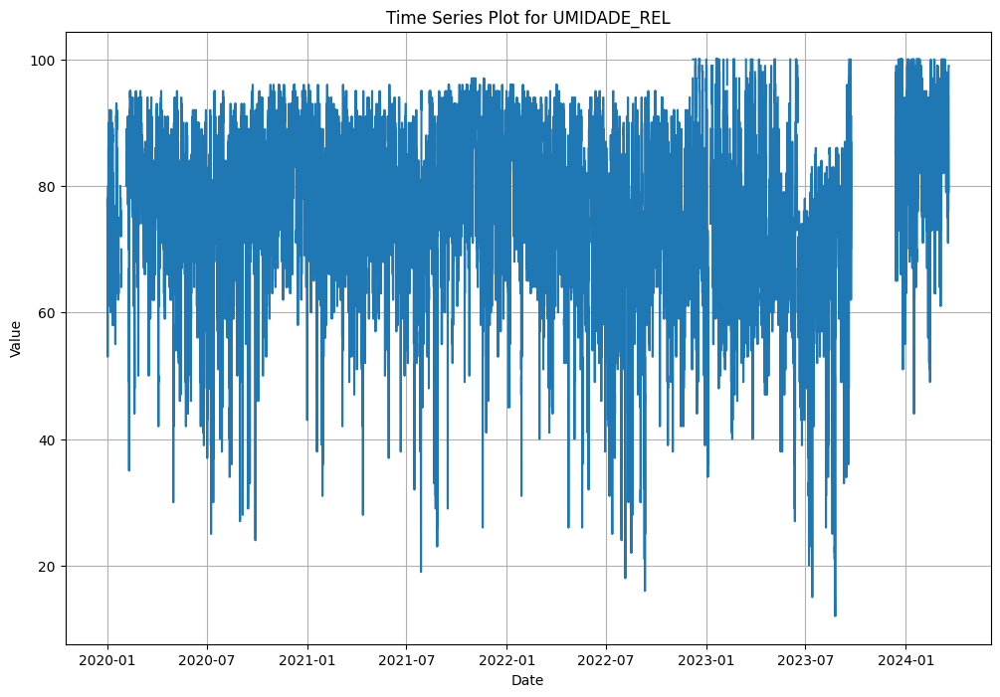

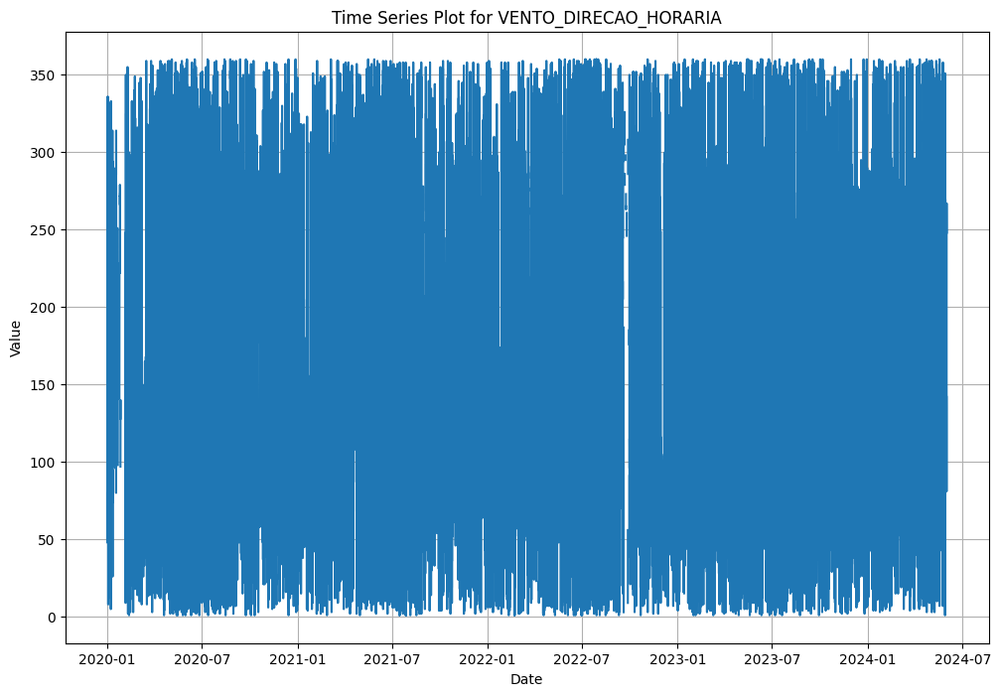

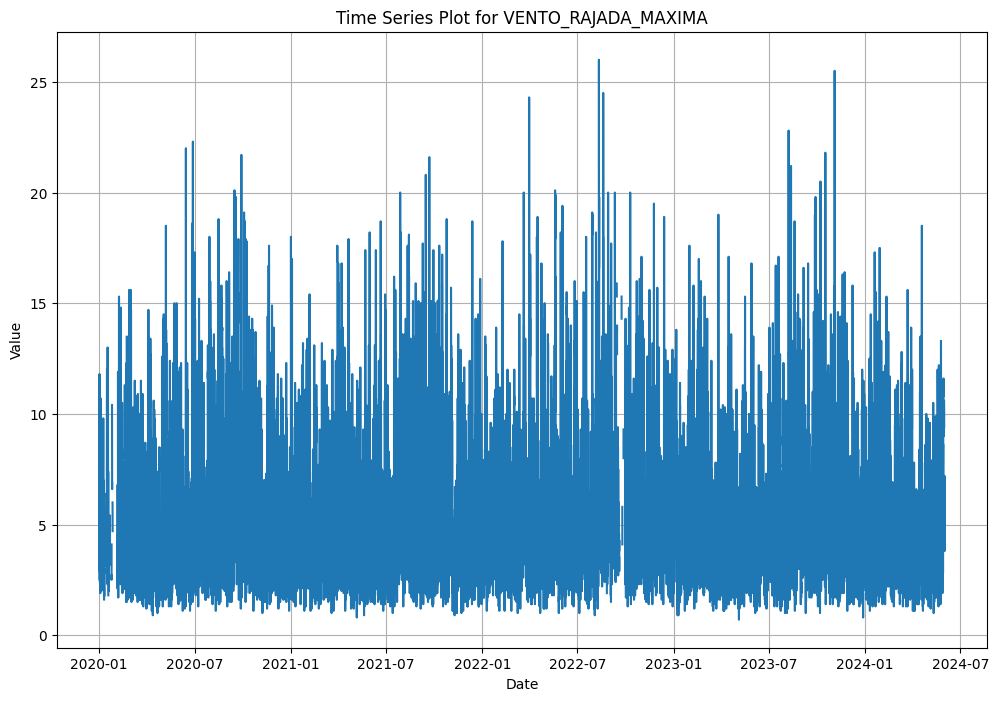

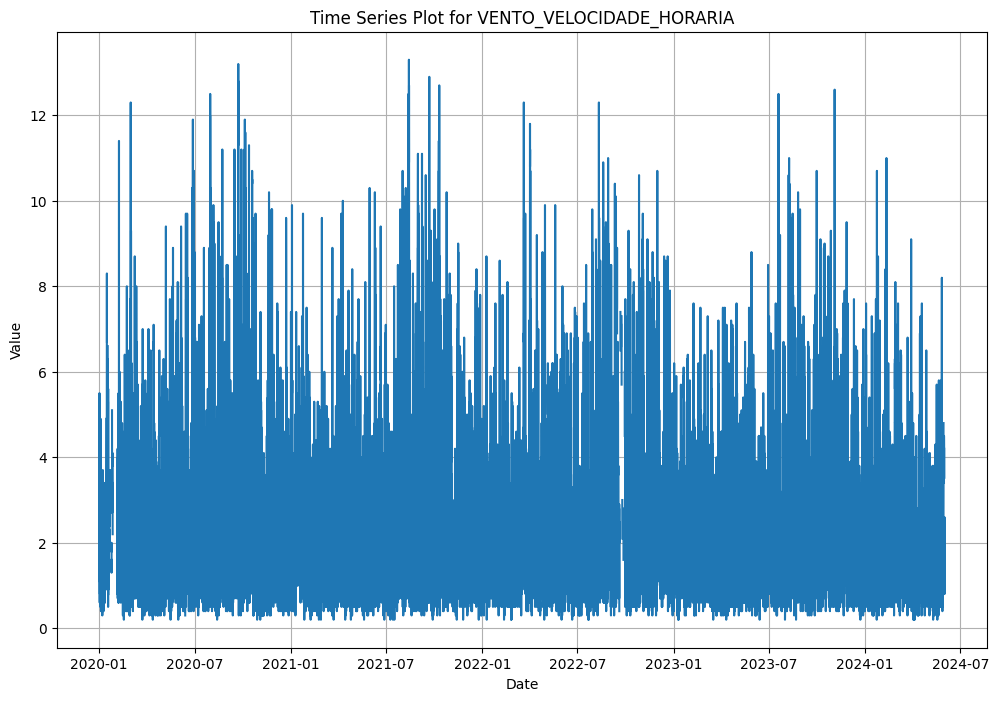

In [35]:
# Plotting Variables
def plot_data(variable: str):
    plt.figure(figsize=(12, 8))
    plt.plot(station_data['DATA_HORA'], station_data[variable])
    plt.title(f'Time Series Plot for {variable}')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.grid(True)
    plt.show()

plot_data(variable = 'PRECIPITACAO_TOTAL')
plot_data(variable = 'PRESSAO_ATM')
plot_data(variable = 'RADIACAO_GLOBAL')
plot_data(variable = 'TEMPERATURA_AR')
plot_data(variable = 'TEMPERATURA_AR_ORVALHO')
plot_data(variable = 'UMIDADE_REL')
plot_data(variable = 'VENTO_DIRECAO_HORARIA')
plot_data(variable = 'VENTO_RAJADA_MAXIMA')
plot_data(variable = 'VENTO_VELOCIDADE_HORARIA')


<Axes: >

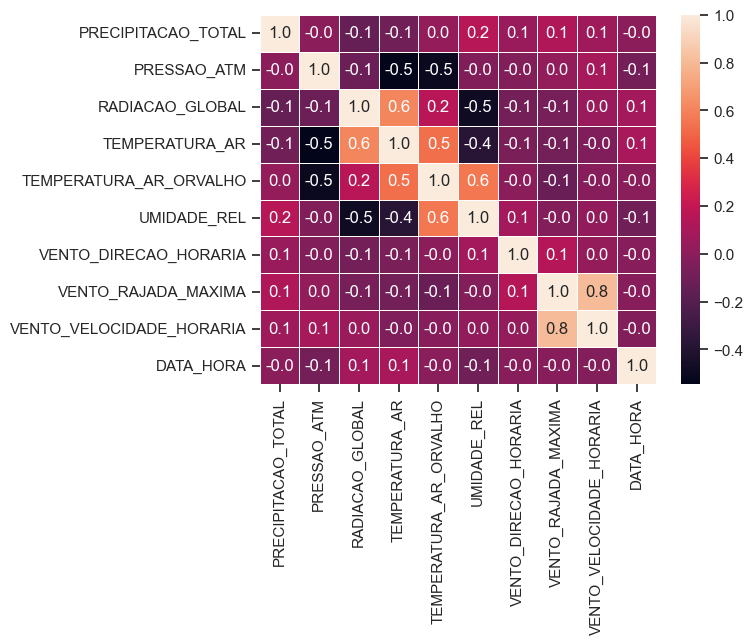

In [42]:
# Correlation Matrix
num_var = ['PRECIPITACAO_TOTAL', 'PRESSAO_ATM', 'RADIACAO_GLOBAL', 'TEMPERATURA_AR', 'TEMPERATURA_AR_ORVALHO',
                            'UMIDADE_REL', 'VENTO_DIRECAO_HORARIA', 'VENTO_RAJADA_MAXIMA', 'VENTO_VELOCIDADE_HORARIA', 'DATA_HORA']
correlation = station_data[num_var].corr()
sns.heatmap(correlation, annot = True, fmt=".1f", linewidths=.6)

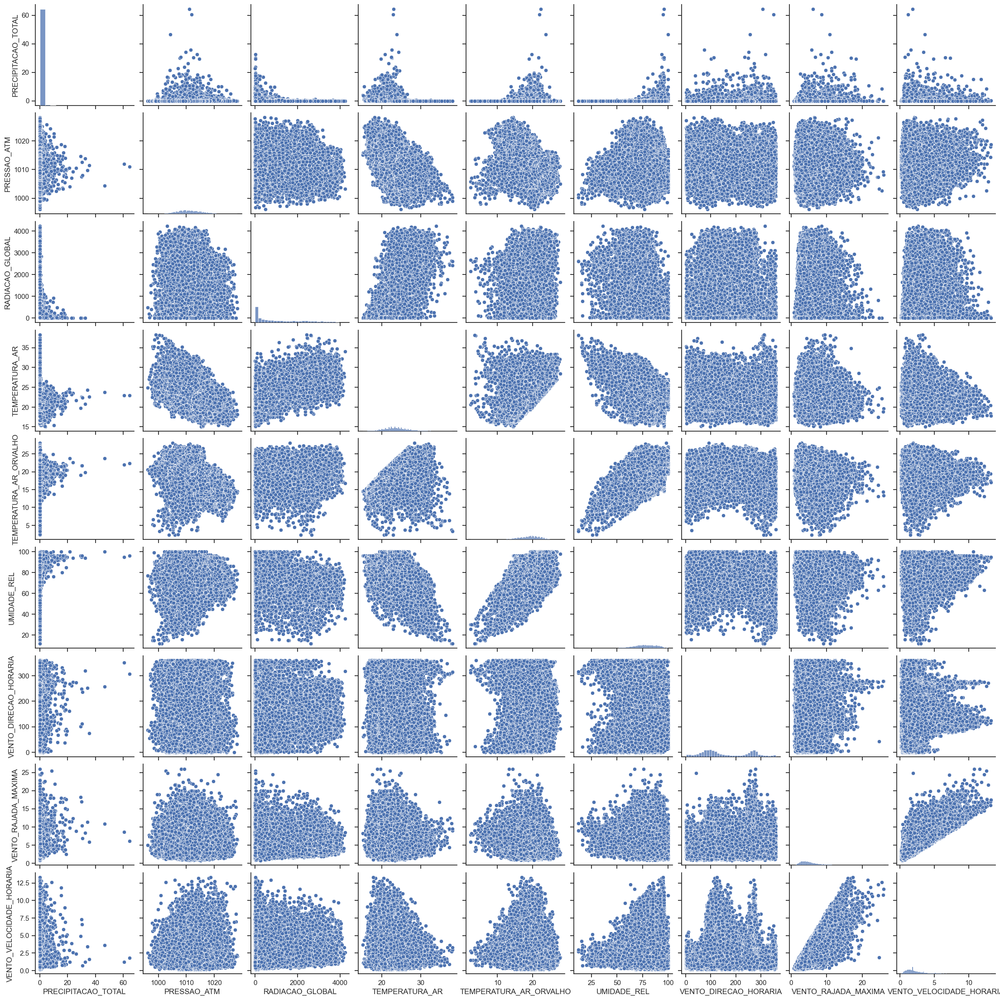

In [43]:
# Scatterplot of the numerical variables 
sns.set_theme(style="ticks")
sns.pairplot(station_data[num_var])

# Deal with missing data

<Axes: xlabel='pct_null', ylabel='variables'>

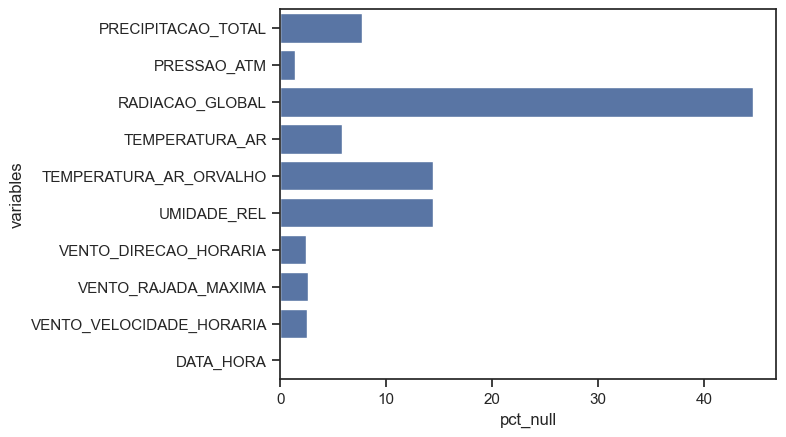

In [143]:
# Calculate the percentage of missing values on the dataset
percent_null = station_data[num_var].isnull().sum() * 100 / len(station_data)

# Create a pandas dataset with missing information
df_pct_null = pd.DataFrame({'variables': num_var, 'pct_null': percent_null})

# Barplot of the percentage of missing values for each variable
sns.barplot(data = df_pct_null, x = "pct_null", y = "variables")

In [144]:
print(df_pct_null)

                                         variables   pct_null
PRECIPITACAO_TOTAL              PRECIPITACAO_TOTAL   7.752118
PRESSAO_ATM                            PRESSAO_ATM   1.397499
RADIACAO_GLOBAL                    RADIACAO_GLOBAL  44.585658
TEMPERATURA_AR                      TEMPERATURA_AR   5.819901
TEMPERATURA_AR_ORVALHO      TEMPERATURA_AR_ORVALHO  14.460632
UMIDADE_REL                            UMIDADE_REL  14.458049
VENTO_DIRECAO_HORARIA        VENTO_DIRECAO_HORARIA   2.451436
VENTO_RAJADA_MAXIMA            VENTO_RAJADA_MAXIMA   2.624509
VENTO_VELOCIDADE_HORARIA  VENTO_VELOCIDADE_HORARIA   2.487601
DATA_HORA                                DATA_HORA   0.000000


In [89]:
 # Split the dataset in train and test
df_train = station_data[station_data['DATA_HORA'].dt.year < 2024]
df_test = station_data[station_data['DATA_HORA'].dt.year == 2024]

print(df_train.shape)
print(df_test.shape)

(35064, 31)
(3648, 31)


In [80]:
# Prepare data to use MICE - Multiple Imputation by Chained Equations
station_data_to_impute_train = df_train[num_var]
station_data_to_impute_test = df_test[num_var]

# Create variables to represent year, month, day and hour
station_data_to_impute_train['ANO'] = station_data_to_impute_train['DATA_HORA'].dt.year
station_data_to_impute_train['MES'] = station_data_to_impute_train['DATA_HORA'].dt.month
station_data_to_impute_train['DIA'] = station_data_to_impute_train['DATA_HORA'].dt.day
station_data_to_impute_train['HORA'] = station_data_to_impute_train['DATA_HORA'].dt.hour
station_data_to_impute_train = station_data_to_impute_train.drop(columns=['DATA_HORA'])

station_data_to_impute_test['ANO'] = station_data_to_impute_test['DATA_HORA'].dt.year
station_data_to_impute_test['MES'] = station_data_to_impute_test['DATA_HORA'].dt.month
station_data_to_impute_test['DIA'] = station_data_to_impute_test['DATA_HORA'].dt.day
station_data_to_impute_test['HORA'] = station_data_to_impute_test['DATA_HORA'].dt.hour
station_data_to_impute_test = station_data_to_impute_test.drop(columns=['DATA_HORA'])

WARNING - (py.warnings._showwarnmsg) - C:\Users\thiag\AppData\Local\Temp\ipykernel_7824\3759128241.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


WARNING - (py.warnings._showwarnmsg) - C:\Users\thiag\AppData\Local\Temp\ipykernel_7824\3759128241.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


WARNING - (py.warnings._showwarnmsg) - C:\Users\thiag\AppData\Local\Temp\ipykernel_7824\3759128241.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

In [85]:
# Define the columns to be imputed and encoded
numerical_cols = ['PRECIPITACAO_TOTAL', 'PRESSAO_ATM', 'RADIACAO_GLOBAL', 'TEMPERATURA_AR', 'TEMPERATURA_AR_ORVALHO', 'UMIDADE_REL', 'VENTO_DIRECAO_HORARIA', 'VENTO_RAJADA_MAXIMA', 
                  'VENTO_VELOCIDADE_HORARIA', 'ANO', 'MES', 'DIA', 'HORA']
categorical_cols = []

# Create a column transformer with OneHotEncoder for categorical columns
preprocessor = ColumnTransformer(
    transformers=[
        ('num', 'passthrough', numerical_cols),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols)
    ]
)

# Initialize the XGBoost regressor
xgb_regressor = XGBRegressor()

# Create the full pipeline with preprocessing and imputation
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('imputer', IterativeImputer(estimator = xgb_regressor, max_iter = 10, random_state = seed, skip_complete = True, min_value = 0)),
])

# Apply the pipeline on the train dataset
imputed_data_train = pipeline.fit_transform(station_data_to_impute_train)

# Convert the numpy array back to a pandas DataFrame
imputed_df_train = pd.DataFrame(imputed_data_train, columns = station_data_to_impute_train.columns)
print(imputed_df_train.shape)

# Apply the pipeline on the train dataset
imputed_data_test = pipeline.transform(station_data_to_impute_test)

# Convert the numpy array back to a pandas DataFrame
imputed_df_test = pd.DataFrame(imputed_data_test, columns = station_data_to_impute_test.columns)
print(imputed_df_test.shape)

WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\sklearn\impute\_iterative.py:825: ConvergenceWarning:

[IterativeImputer] Early stopping criterion not reached.




(35064, 13)
(3648, 13)


# Time series modelling with NeuralProphet

In [112]:
# Creating the training dataset with variables of interest
data_train = {'ds' : df_train['DATA_HORA'].values, 
        'y' : imputed_df_train['TEMPERATURA_AR'].values} 
df_train_f = pd.DataFrame(data_train)

# Creating the test dataset with variables of interest
data_test = {'ds' : df_test['DATA_HORA'].values, 
        'y' : imputed_df_test['TEMPERATURA_AR'].values}
df_test_f = pd.DataFrame(data_test)

# Print data sizes
print("Dataset size:", len(station_data))
print("Train dataset size:", len(df_train_f))
print("Validation dataset size:", len(df_test_f))

Dataset size: 38712
Train dataset size: 35064
Validation dataset size: 3648


# NeuralProphet - Linear Trend + Seasonality Model

In [128]:
# Model and prediction
m = NeuralProphet(
    # Trend changepoints
    n_changepoints = 0,
    # Seasonality components
    yearly_seasonality = True,
    weekly_seasonality = False,
    daily_seasonality = True
)

# Training and Validation of the model
metrics = m.fit(df_train_f, validation_df = df_test_f, epochs = 100, freq = 'h')
metrics

WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


INFO - (NP.df_utils._infer_frequency) - Major frequency h corresponds to 99.997% of the data.
WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\df_utils.py:1152: FutureWarning:

Series.view is depr

Epoch 100: 100%|██████████| 100/100 [00:01<00:00, 83.34it/s, loss=0.029, v_num=24, MAE_val=1.720, RMSE_val=2.180, Loss_val=0.0434, RegLoss_val=0.000, MAE=1.610, RMSE=2.160, Loss=0.0303, RegLoss=0.000]    


,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
0,2.287946,2.753320,0.068852,0.0,0,4.995911,6.359676,0.189195,0.0
1,1.733917,2.192322,0.043739,0.0,1,1.639615,2.191357,0.030957,0.0
2,1.705557,2.170037,0.042886,0.0,2,1.621489,2.165873,0.030539,0.0
3,1.778000,2.226878,0.045442,0.0,3,1.622900,2.167532,0.030588,0.0
4,1.761211,2.209909,0.044416,0.0,4,1.627409,2.172737,0.030725,0.0
...,...,...,...,...,...,...,...,...,...
95,1.735824,2.195060,0.043938,0.0,95,1.615301,2.157716,0.030343,0.0
96,1.723267,2.185630,0.043557,0.0,96,1.614680,2.156465,0.030316,0.0
97,1.735719,2.202474,0.044128,0.0,97,1.614511,2.156855,0.030332,0.0
98,1.717648,2.174912,0.043105,0.0,98,1.615115,2.157564,0.030316,0.0


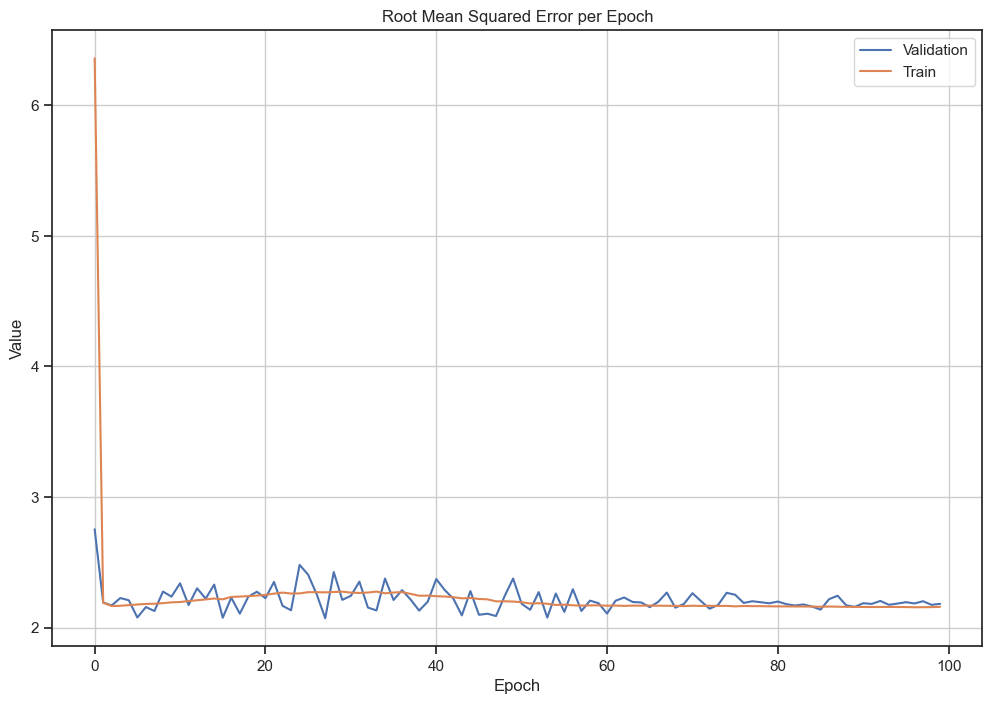

In [129]:
# Plot RMSE on each epoch
plt.figure(figsize=(12, 8))
plt.plot(metrics['epoch'], metrics['RMSE_val'], label = 'Validation')
plt.plot(metrics['epoch'], metrics['RMSE'], label = 'Train')
plt.title('Root Mean Squared Error per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Value')
plt.grid(True)
plt.legend(loc="best")
plt.show()

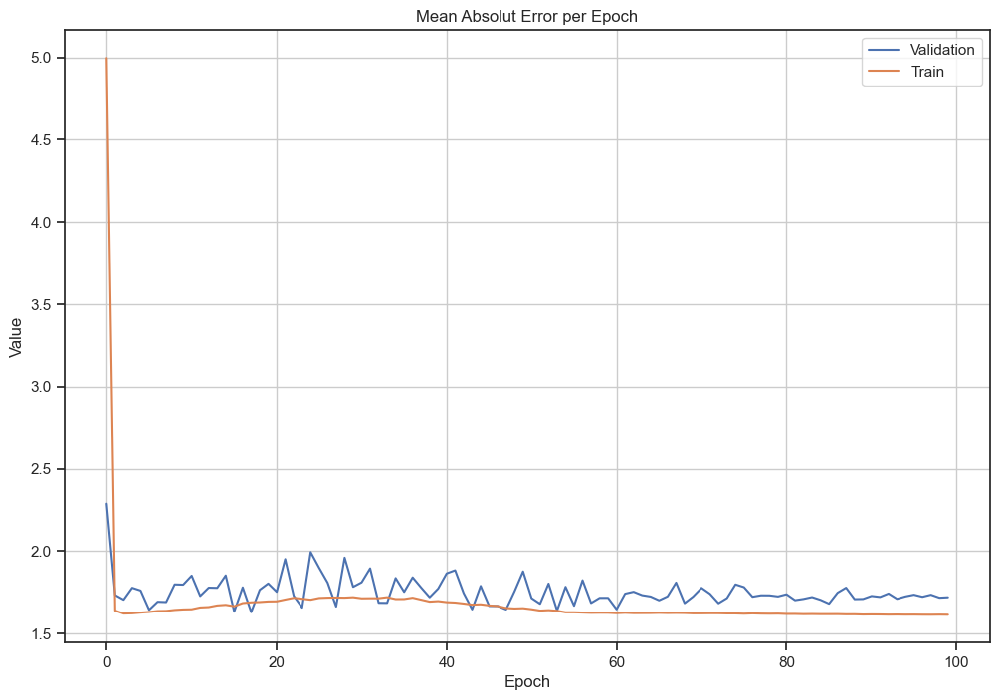

In [130]:
# Plot MAE on each epoch
plt.figure(figsize=(12, 8))
plt.plot(metrics['epoch'], metrics['MAE_val'], label = 'Validation')
plt.plot(metrics['epoch'], metrics['MAE'], label = 'Train')
plt.title('Mean Absolut Error per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Value')
plt.grid(True)
plt.legend(loc="best")
plt.show()

WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\plot_model_parameters_plotly.py:178: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result


WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\plot_model_parameters_plotly.py:475: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result


WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\plot_model_parameters

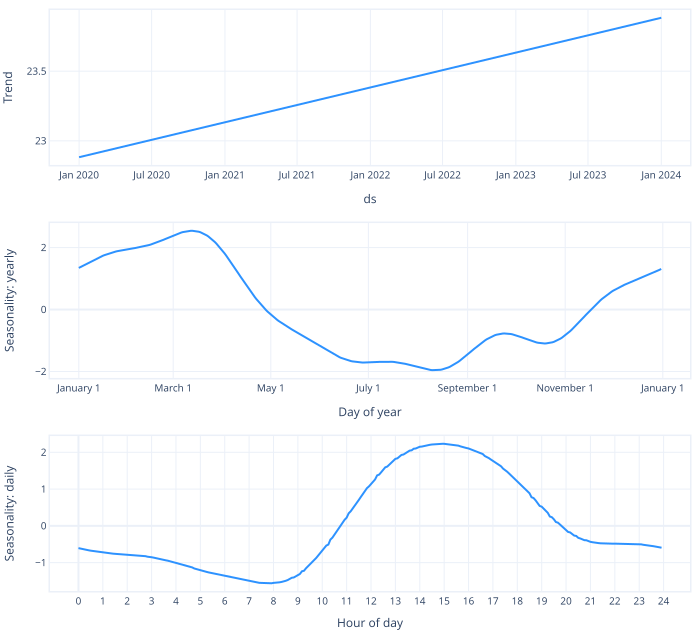

In [131]:
# Plot model parameters
m.set_plotting_backend("plotly-static")
m.plot_parameters(components=['trend', 'seasonality'])

WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


INFO - (NP.df_utils._infer_frequency) - Major frequency h corresponds to 99.973% of the data.
WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


INFO - (NP.df_util

Predicting DataLoader 0: 100%|██████████| 4/4 [00:00<00:00, 219.65it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\plot_forecast_plotly.py:100: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result




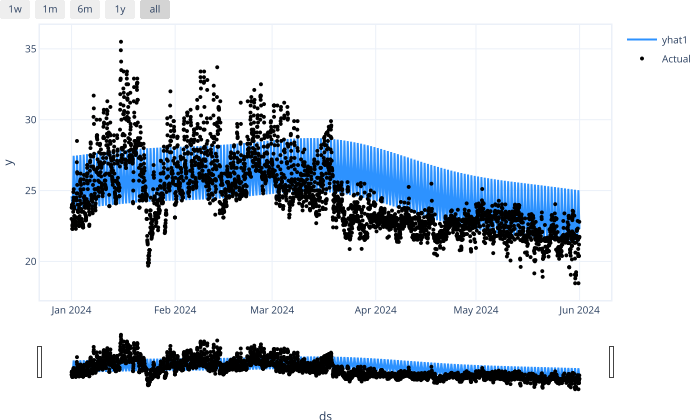

In [132]:
# Making predictions
forecast = m.predict(df_test_f)
m.plot(forecast)

## NeuralProphet - 10 Changepoints Trend + Seasonality Model

In [133]:
# Model and prediction
m = NeuralProphet(
    # Trend changepoints
    n_changepoints = 10,
    # Seasonality components
    yearly_seasonality = True,
    weekly_seasonality = False,
    daily_seasonality = True
)

# Training and Validation of the model
metrics = m.fit(df_train_f, validation_df = df_test_f, epochs = 100, freq = 'h')
metrics

WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


INFO - (NP.df_utils._infer_frequency) - Major frequency h corresponds to 99.997% of the data.
WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\df_utils.py:1152: FutureWarning:

Series.view is depr

Epoch 100: 100%|██████████| 100/100 [00:01<00:00, 64.96it/s, loss=0.0281, v_num=25, MAE_val=2.270, RMSE_val=2.710, Loss_val=0.0672, RegLoss_val=0.000, MAE=1.540, RMSE=2.080, Loss=0.0284, RegLoss=0.000]   


,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
0,7.492259,7.723009,0.406300,0.0,0,9.310825,10.883911,0.385442,0.0
1,3.775532,4.184960,0.148775,0.0,1,3.750286,4.869267,0.101239,0.0
2,2.104543,2.547462,0.059047,0.0,2,2.497584,3.313743,0.056058,0.0
3,2.043306,2.498240,0.056968,0.0,3,1.961438,2.580495,0.039200,0.0
4,2.204731,2.637791,0.063917,0.0,4,1.749903,2.317356,0.033528,0.0
...,...,...,...,...,...,...,...,...,...
95,2.256302,2.700102,0.066570,0.0,95,1.540713,2.079287,0.028372,0.0
96,2.209061,2.646472,0.063885,0.0,96,1.540857,2.078411,0.028367,0.0
97,2.215990,2.655177,0.064477,0.0,97,1.539355,2.077294,0.028356,0.0
98,2.235914,2.684512,0.065830,0.0,98,1.539972,2.077817,0.028353,0.0


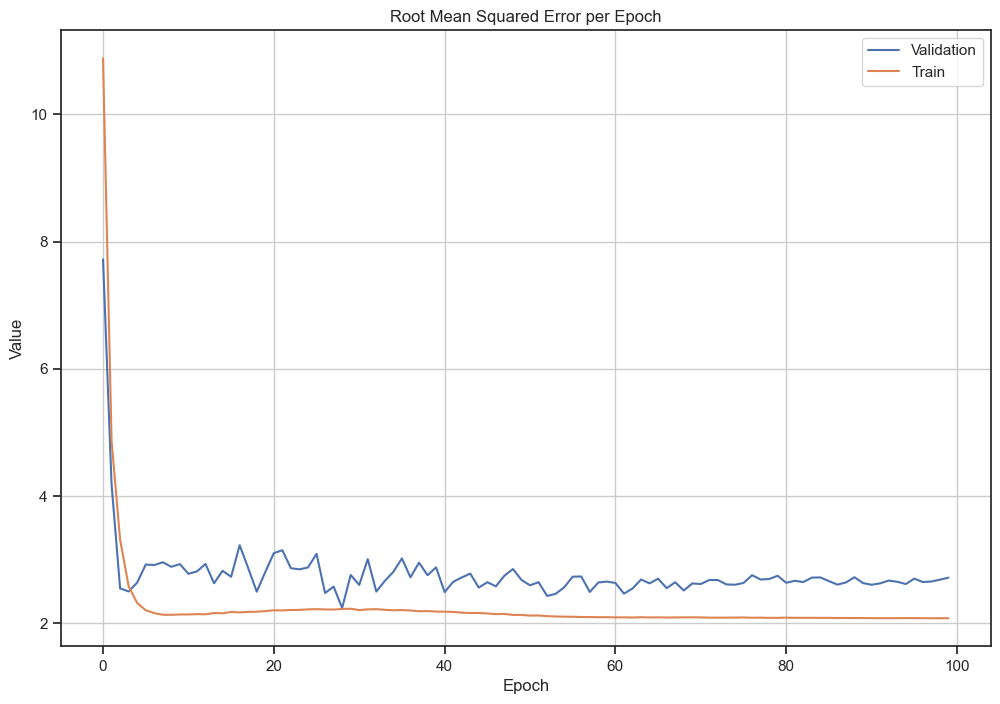

In [134]:
# Plot RMSE on each epoch
plt.figure(figsize=(12, 8))
plt.plot(metrics['epoch'], metrics['RMSE_val'], label = 'Validation')
plt.plot(metrics['epoch'], metrics['RMSE'], label = 'Train')
plt.title('Root Mean Squared Error per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Value')
plt.grid(True)
plt.legend(loc="best")
plt.show()

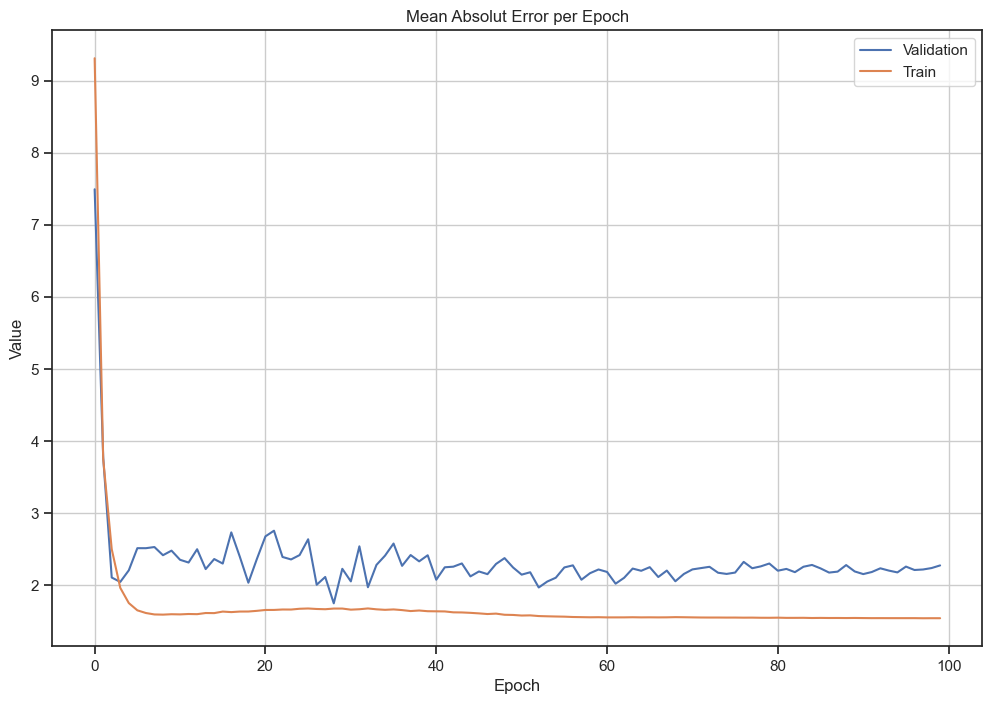

In [135]:
# Plot MAE on each epoch
plt.figure(figsize=(12, 8))
plt.plot(metrics['epoch'], metrics['MAE_val'], label = 'Validation')
plt.plot(metrics['epoch'], metrics['MAE'], label = 'Train')
plt.title('Mean Absolut Error per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Value')
plt.grid(True)
plt.legend(loc="best")
plt.show()

WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\plot_model_parameters_plotly.py:237: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result


WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\plot_model_parameters_plotly.py:271: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result


WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\plot_model_parameters

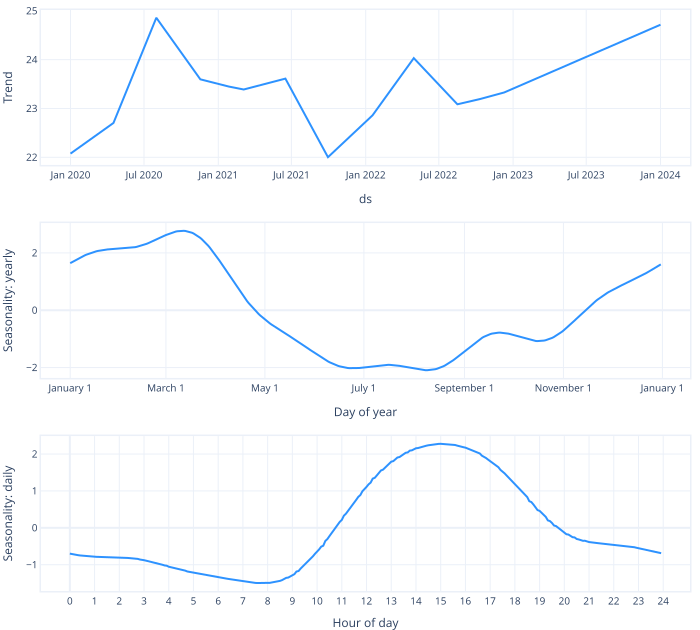

In [136]:
# Plot model parameters
m.set_plotting_backend("plotly-static")
m.plot_parameters(components=['trend', 'seasonality'])

WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


INFO - (NP.df_utils._infer_frequency) - Major frequency h corresponds to 99.973% of the data.
WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


INFO - (NP.df_util

Predicting DataLoader 0: 100%|██████████| 4/4 [00:00<00:00, 137.68it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\plot_forecast_plotly.py:100: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result




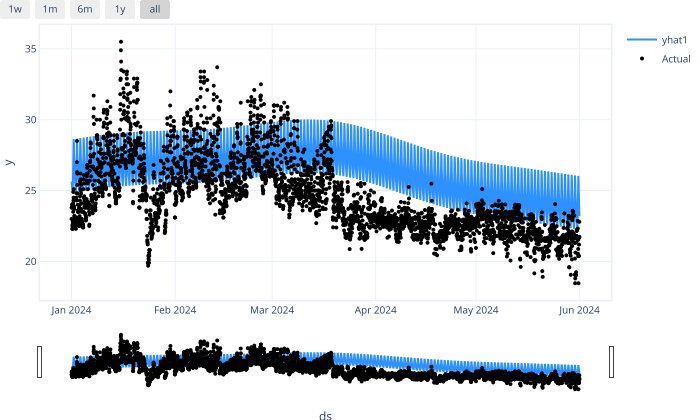

In [137]:
# Making predictions
forecast = m.predict(df_test_f)
m.plot(forecast)

# NeuralProphet - 10 Changepoints Trend + Seasonality + AR 

In [123]:
# Model and prediction
m = NeuralProphet(
    # Trend changepoints
    n_changepoints = 10,
    # Seasonality components
    yearly_seasonality = True,
    weekly_seasonality = False,
    daily_seasonality = True,
    # Autoregressive Component
    n_lags = 24
)

# Training and Validation of the model
metrics = m.fit(df_train_f, validation_df = df_test_f, epochs = 100, freq = 'h')
metrics

WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


INFO - (NP.df_utils._infer_frequency) - Major frequency h corresponds to 99.997% of the data.
WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\df_utils.py:1152: FutureWarning:

Series.view is depr

Epoch 100: 100%|██████████| 100/100 [00:04<00:00, 24.48it/s, loss=0.00452, v_num=23, MAE_val=0.601, RMSE_val=0.843, Loss_val=0.00648, RegLoss_val=0.000, MAE=0.533, RMSE=0.802, Loss=0.00447, RegLoss=0.000]   


,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
0,5.187072,6.363859,0.260050,0.0,0,21.150459,23.831135,1.125283,0.0
1,2.658719,3.156410,0.086791,0.0,1,3.591405,4.376610,0.111869,0.0
2,1.697838,2.036710,0.037697,0.0,2,2.017223,2.484819,0.041425,0.0
3,1.326380,1.649242,0.024764,0.0,3,1.448468,1.864442,0.023493,0.0
4,1.152238,1.464380,0.019549,0.0,4,1.247998,1.651986,0.018488,0.0
...,...,...,...,...,...,...,...,...,...
95,0.600594,0.841637,0.006464,0.0,95,0.533282,0.802777,0.004468,0.0
96,0.600924,0.843127,0.006487,0.0,96,0.533132,0.802405,0.004469,0.0
97,0.600570,0.842400,0.006476,0.0,97,0.532963,0.802687,0.004469,0.0
98,0.600530,0.842686,0.006480,0.0,98,0.532891,0.802208,0.004467,0.0


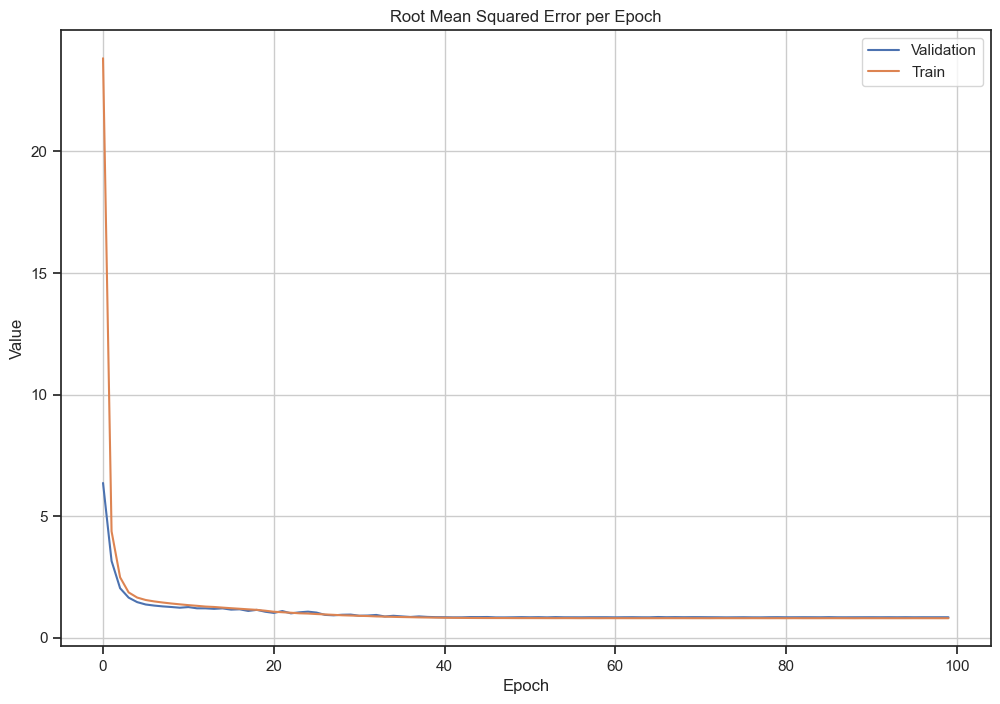

In [124]:
# Plot RMSE on each epoch
plt.figure(figsize=(12, 8))
plt.plot(metrics['epoch'], metrics['RMSE_val'], label = 'Validation')
plt.plot(metrics['epoch'], metrics['RMSE'], label = 'Train')
plt.title('Root Mean Squared Error per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Value')
plt.grid(True)
plt.legend(loc="best")
plt.show()

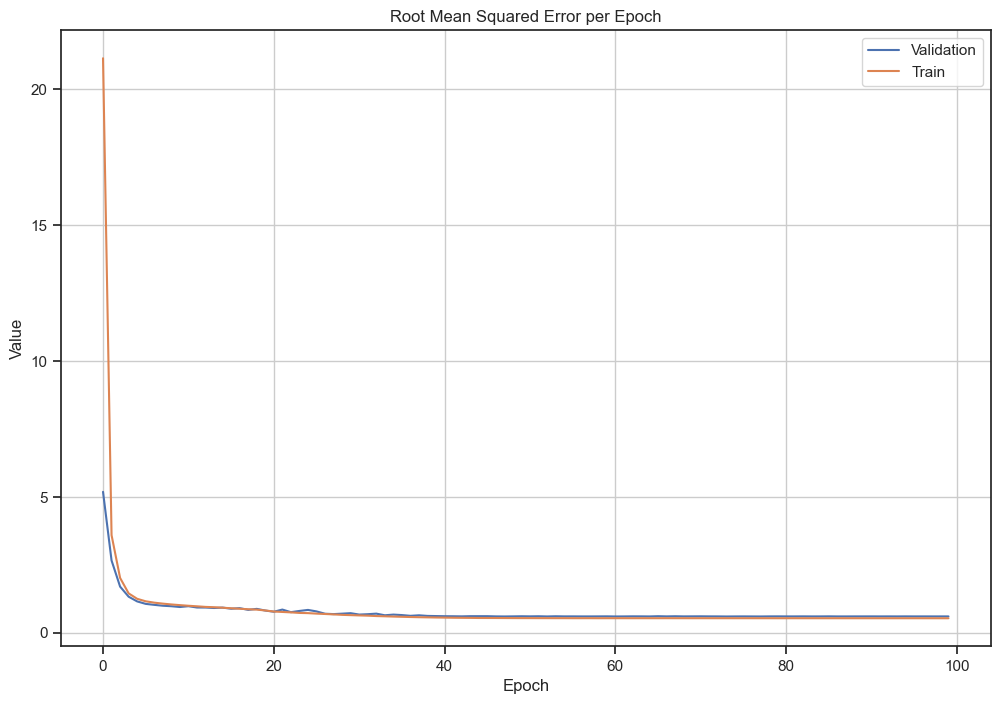

In [125]:
# Plot MAE on each epoch
plt.figure(figsize=(12, 8))
plt.plot(metrics['epoch'], metrics['MAE_val'], label = 'Validation')
plt.plot(metrics['epoch'], metrics['MAE'], label = 'Train')
plt.title('Mean Absolute Error per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Value')
plt.grid(True)
plt.legend(loc="best")
plt.show()

WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\plot_model_parameters_plotly.py:237: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result


WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\plot_model_parameters_plotly.py:271: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result


WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\plot_model_parameters

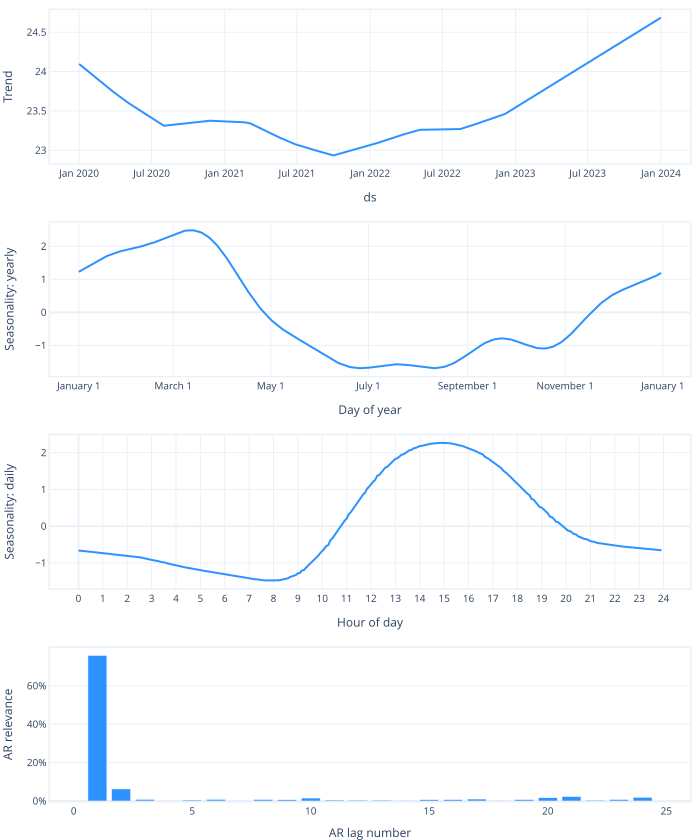

In [126]:
# Plot model parameters
m.set_plotting_backend("plotly-static")
m.plot_parameters(components=['trend', 'seasonality', 'autoregression'])

WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


INFO - (NP.df_utils._infer_frequency) - Major frequency h corresponds to 99.973% of the data.
WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


INFO - (NP.df_util

INFO - (NP.df_utils._infer_frequency) - Major frequency h corresponds to 99.973% of the data.
WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - h


Predicting DataLoader 0: 100%|██████████| 4/4 [00:00<00:00, 82.64it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\plot_forecast_plotly.py:100: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result




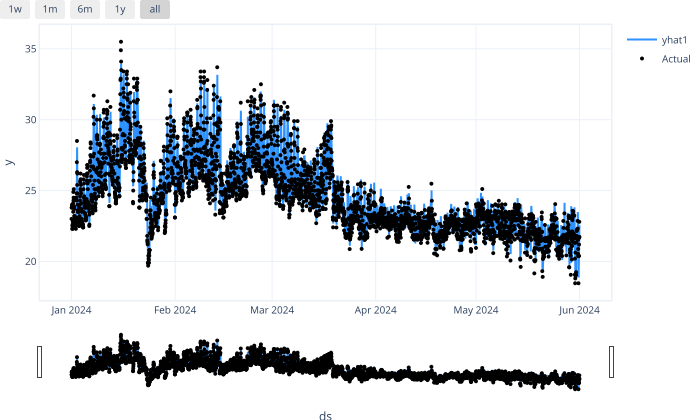

In [127]:
# Making predictions
forecast = m.predict(df_test_f)
m.plot(forecast)

# NeuralProphet - Seasonality + ARNET

In [138]:
# Model and prediction
m = NeuralProphet(
    # Trend changepoints
    n_changepoints = 10,
    # Seasonality components
    yearly_seasonality = True,
    weekly_seasonality = False,
    daily_seasonality = True,
    # Autoregressive Component
    n_lags = 24,
    ar_layers = [12, 12, 12, 12]
)

# Training and Validation of the model
metrics = m.fit(df_train_f, validation_df = df_test_f, epochs = 100, freq = 'h')
metrics

WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


INFO - (NP.df_utils._infer_frequency) - Major frequency h corresponds to 99.997% of the data.
WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\df_utils.py:1152: FutureWarning:

Series.view is depr

Epoch 100: 100%|██████████| 100/100 [00:04<00:00, 21.26it/s, loss=0.00424, v_num=26, MAE_val=0.587, RMSE_val=0.821, Loss_val=0.00616, RegLoss_val=0.000, MAE=0.526, RMSE=0.785, Loss=0.00426, RegLoss=0.000]    


,MAE_val,RMSE_val,Loss_val,RegLoss_val,epoch,MAE,RMSE,Loss,RegLoss
0,1.669871,2.156826,0.041702,0.0,0,4.809445,6.240659,0.177014,0.0
1,0.968468,1.253056,0.014473,0.0,1,1.445876,1.915148,0.024795,0.0
2,0.919690,1.192486,0.013060,0.0,2,1.000647,1.342122,0.012564,0.0
3,0.855387,1.126257,0.011675,0.0,3,0.864873,1.165767,0.009498,0.0
4,0.788689,1.034404,0.009846,0.0,4,0.768082,1.046501,0.007658,0.0
...,...,...,...,...,...,...,...,...,...
95,0.586822,0.821432,0.006159,0.0,95,0.525724,0.782988,0.004262,0.0
96,0.589665,0.824055,0.006198,0.0,96,0.526092,0.784942,0.004262,0.0
97,0.587598,0.822337,0.006172,0.0,97,0.525809,0.783896,0.004260,0.0
98,0.593345,0.827104,0.006244,0.0,98,0.525593,0.783794,0.004261,0.0


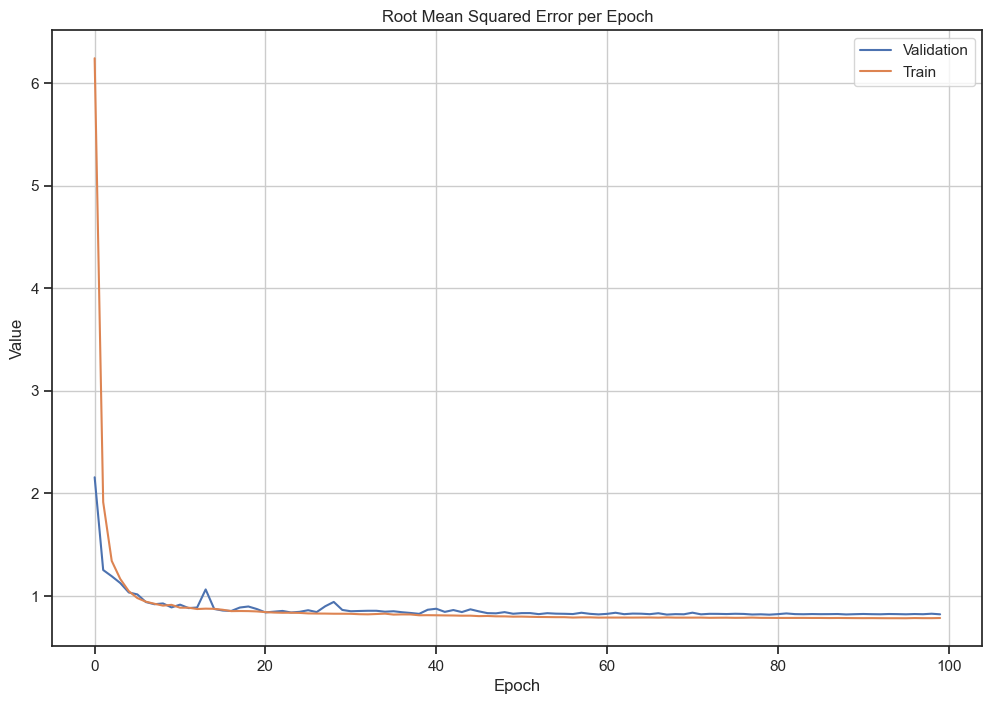

In [139]:
# Plot RMSE on each epoch
plt.figure(figsize=(12, 8))
plt.plot(metrics['epoch'], metrics['RMSE_val'], label = 'Validation')
plt.plot(metrics['epoch'], metrics['RMSE'], label = 'Train')
plt.title('Root Mean Squared Error per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Value')
plt.grid(True)
plt.legend(loc="best")
plt.show()

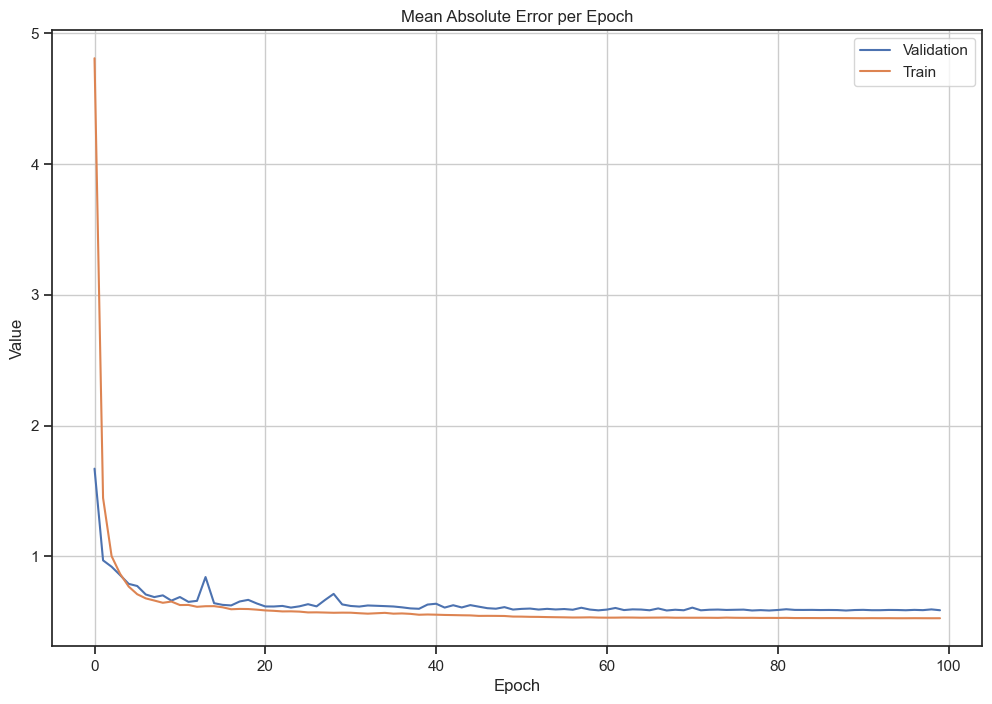

In [140]:
# Plot MAE on each epoch
plt.figure(figsize=(12, 8))
plt.plot(metrics['epoch'], metrics['MAE_val'], label = 'Validation')
plt.plot(metrics['epoch'], metrics['MAE'], label = 'Train')
plt.title('Mean Absolute Error per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Value')
plt.grid(True)
plt.legend(loc="best")
plt.show()

WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\plot_model_parameters_plotly.py:237: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result


WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\plot_model_parameters_plotly.py:271: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result


WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\plot_model_parameters

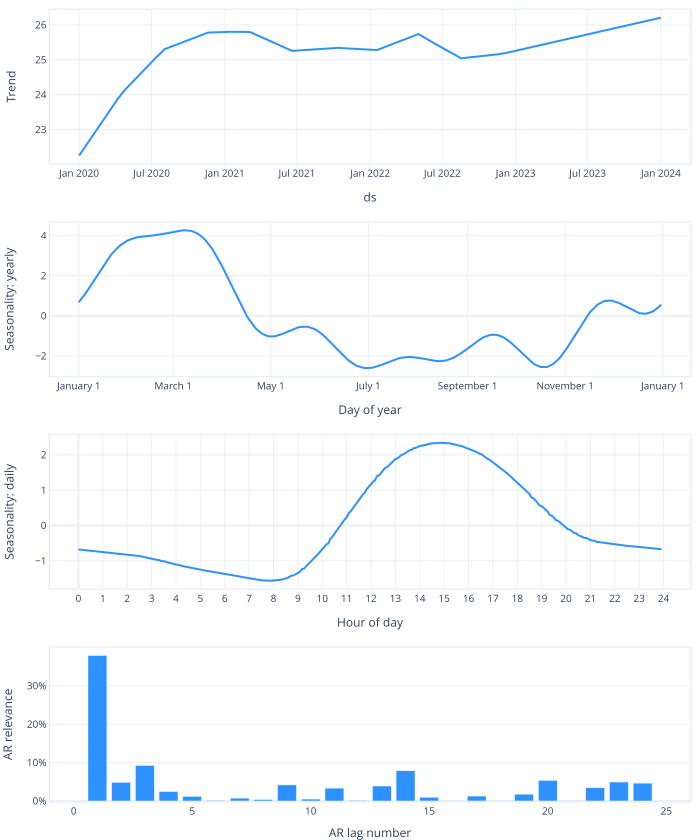

In [141]:
# Plot model parameters
m.set_plotting_backend("plotly-static")
m.plot_parameters(components=['trend', 'seasonality', 'autoregression'])

WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


INFO - (NP.df_utils._infer_frequency) - Major frequency h corresponds to 99.973% of the data.
WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


INFO - (NP.df_util

Predicting DataLoader 0: 100%|██████████| 4/4 [00:00<00:00, 57.33it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (py.warnings._showwarnmsg) - c:\Users\thiag\OneDrive\Documentos\Python Projects\INMET_DATA\.venv\Lib\site-packages\neuralprophet\plot_forecast_plotly.py:100: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result




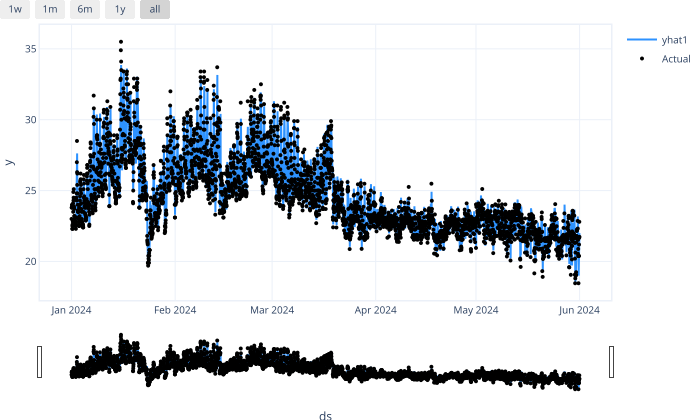

In [142]:
# Making predictions
forecast = m.predict(df_test_f)
m.plot(forecast)